In [3]:
import cv2

image_path = r"/content/profile.pic.jpeg"

img = cv2.imread(image_path)

if img is None:
    raise FileNotFoundError("Image not found")

print("Image Shape:", img.shape)

x = 100
y = 100

pixel = img[y, x]

print("Pixel value at (100, 100):".encode('utf-8').decode('unicode_escape'), pixel)

Streaming output truncated to the last 5000 lines.
[28 24 23]
[10  5  6]
[12  7  8]
[11  6  7]
[11  6  7]
[15  8 11]
[15  8 11]
[12  7  9]
[12  7  9]
[13  8 10]
[13  8 10]
[14  9 11]
[14  9 11]
[15 10 12]
[15 10 12]
[16 11 13]
[16 11 13]
[16 11 13]
[17 12 14]
[17 12 14]
[17 12 14]
[17 12 14]
[17 12 14]
[15 10 12]
[15 10 12]
[16 11 13]
[18 13 15]
[20 15 17]
[21 16 18]
[22 17 19]
[23 18 20]
[22 17 19]
[23 18 20]
[24 19 21]
[25 20 22]
[26 21 23]
[26 21 23]
[25 20 22]
[25 20 22]
[26 21 23]
[27 22 24]
[28 23 25]
[29 24 26]
[30 25 27]
[29 24 26]
[29 24 26]
[29 24 26]
[29 24 26]
[29 24 26]
[28 23 25]
[28 23 25]
[28 23 25]
[27 22 24]
[27 22 24]
[27 22 24]
[25 22 24]
[25 22 24]
[25 22 24]
[25 22 24]
[26 23 25]
[27 24 26]
[28 25 27]
[29 26 28]
[28 25 27]
[28 25 27]
[28 25 27]
[29 26 28]
[29 26 28]
[29 26 28]
[30 27 29]
[30 27 29]
[30 27 29]
[29 26 28]
[29 26 28]
[30 27 29]
[30 27 29]
[32 29 31]
[33 30 32]
[34 31 33]
[34 31 33]
[36 33 35]
[39 36 38]
[41 38 40]
[42 39 41]
[43 40 42]
[46 43 45]
[48

DisabledFunctionError: cv2.imshow() is disabled in Colab, because it causes Jupyter sessions
to crash; see https://github.com/jupyter/notebook/issues/3935.
As a substitution, consider using
  from google.colab.patches import cv2_imshow


---

## 1. Extract pixel values of an image (Colab-compatible version)

Image Shape: (1600, 1181, 3)
Pixel value at (100, 100): [ 64 169 236]


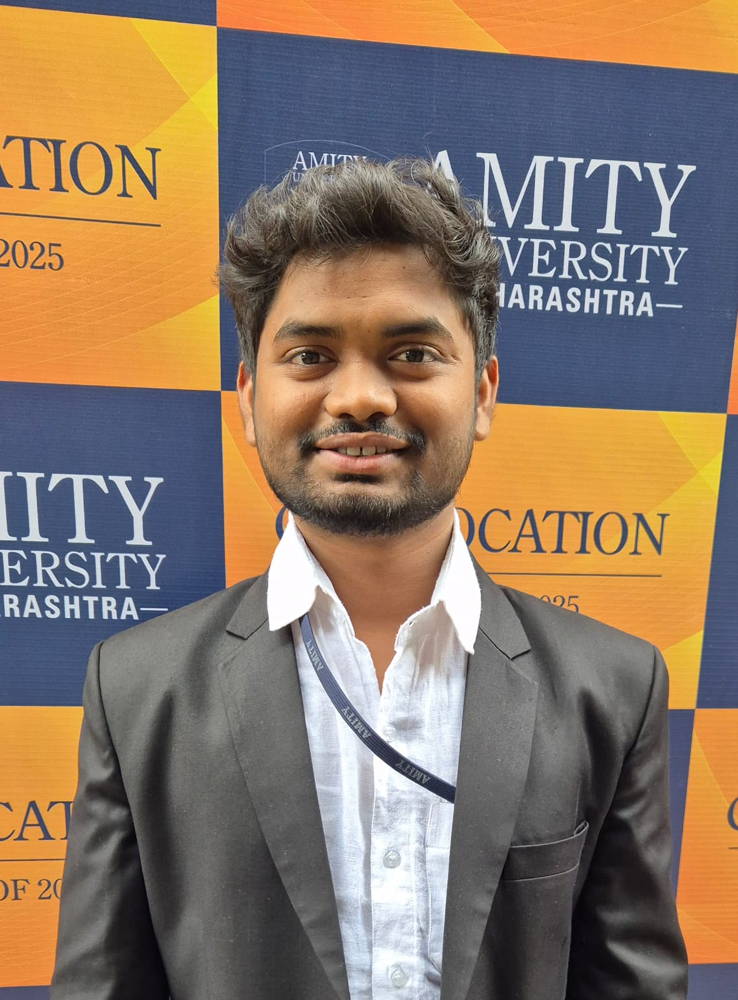

In [4]:
import cv2
from google.colab.patches import cv2_imshow

image_path = r"/content/profile.pic.jpeg"

img = cv2.imread(image_path)

if img is None:
    raise FileNotFoundError("Image not found")

print("Image Shape:", img.shape)

x = 100
y = 100

pixel = img[y, x]

print("Pixel value at (100, 100):".encode('utf-8').decode('unicode_escape'), pixel)

# Display the image using cv2_imshow for Colab compatibility
cv2_imshow(img)

---

## 2. Demonstrate different mathematical operations on a digital image (Colab-compatible version)

In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image_path = r"/content/profile.pic.jpeg"

img = cv2.imread(image_path)

if img is None:
    raise FileNotFoundError("Image not found")

added = cv2.add(img, 50)
subtracted = cv2.subtract(img, 50)
multiplied = cv2.multiply(img, np.array([1.5]))
divided = cv2.divide(img, np.array([2.0]))
negative = 255 - img

# Displaying images using cv2_imshow for Colab compatibility
cv2_imshow(img)
print("Original")
cv2_imshow(added)
print("Addition")
cv2_imshow(subtracted)
print("Subtraction")
cv2_imshow(multiplied)
print("Multiplication")
cv2_imshow(divided)
print("Division")
cv2_imshow(negative)
print("Negative")

FileNotFoundError: Image not found

---

## 3. Image negation (Colab-compatible version)

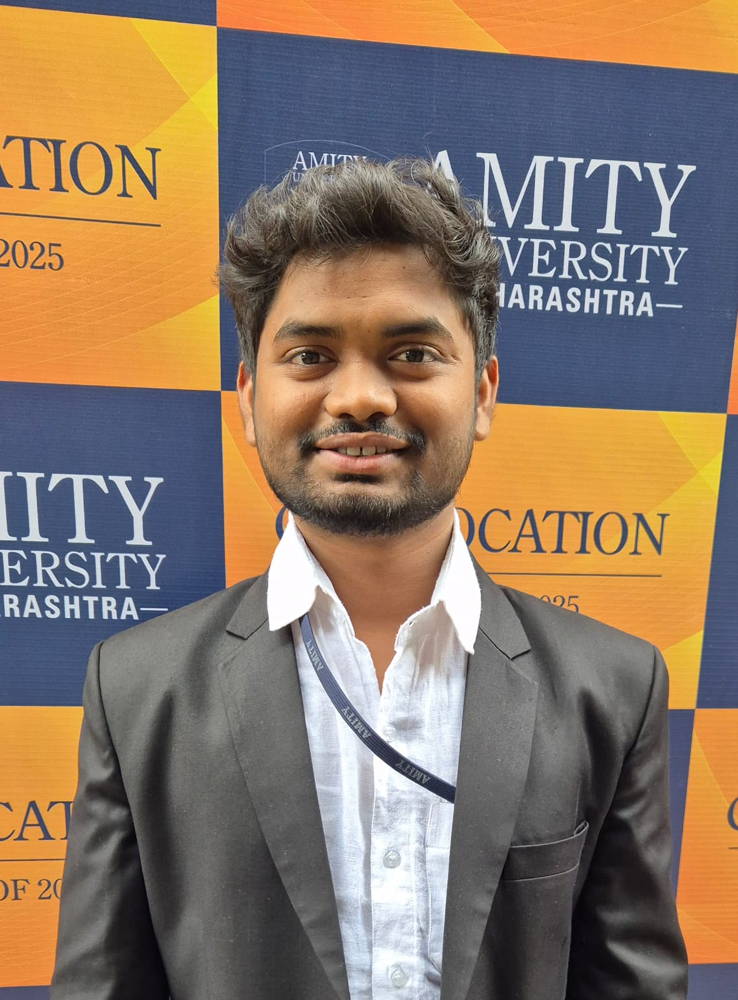

Original Image


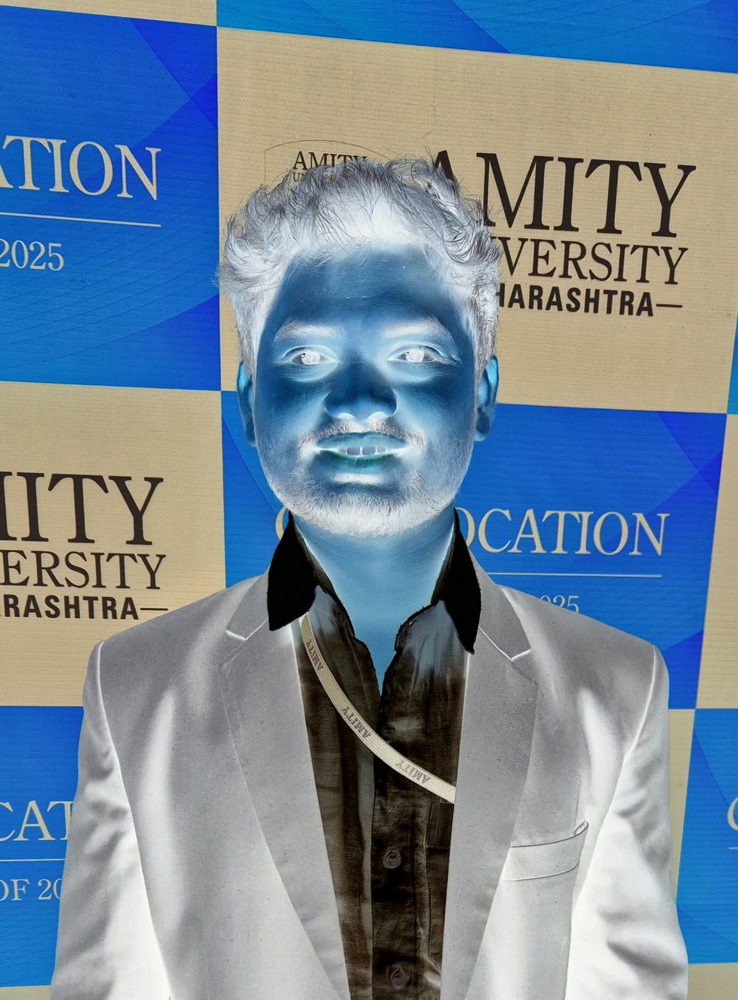

Negative Image
Negative image saved to /content/negative.jpg


In [6]:
import cv2
from google.colab.patches import cv2_imshow

image_path = r"/content/profile.pic.jpeg"

img = cv2.imread(image_path)

if img is None:
    raise FileNotFoundError("Image not found")

negative = 255 - img

cv2_imshow(img)
print("Original Image")
cv2_imshow(negative)
print("Negative Image")

cv2.imwrite(
    r"/content/negative.jpg",
    negative
)
print("Negative image saved to /content/negative.jpg")

---

## 4. Histogram mapping, histogram equalization and histogram stretching (Colab-compatible version)

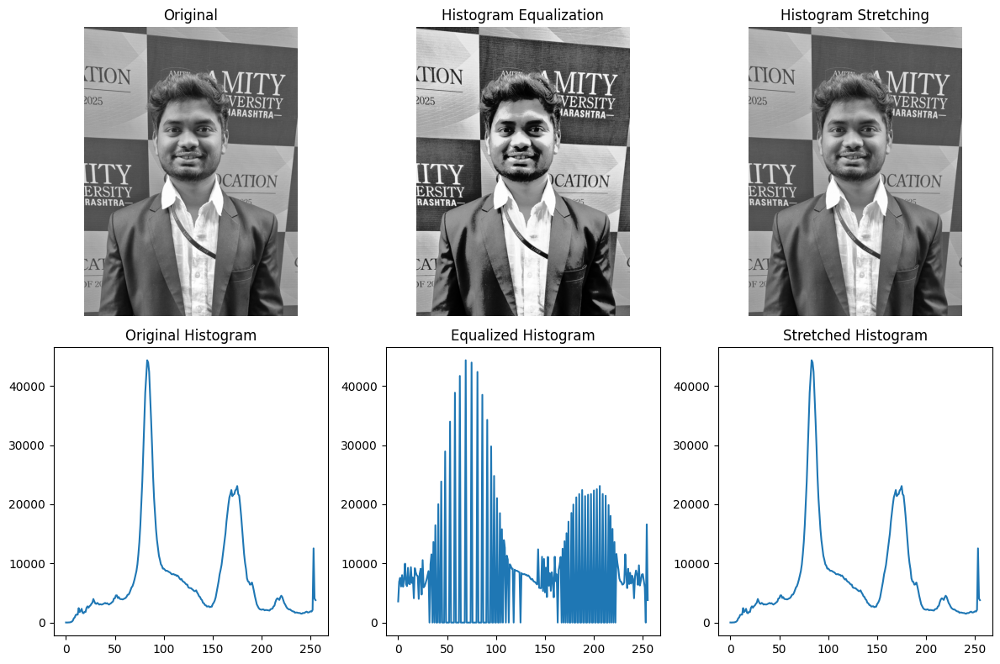

Equalized image saved to /content/equalized.jpg
Stretched image saved to /content/stretched.jpg


In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_path = r"/content/profile.pic.jpeg"

img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    raise FileNotFoundError("Image not found")

histogram = cv2.calcHist(
    [img],
    [0],
    None,
    [256],
    [0, 256]
)

equalized = cv2.equalizeHist(img)

min_value = np.min(img)
max_value = np.max(img)

stretched = (
    (img - min_value) /
    (max_value - min_value) *
    255
).astype(np.uint8)

equalized_histogram = cv2.calcHist(
    [equalized],
    [0],
    None,
    [256],
    [0, 256]
)

stretched_histogram = cv2.calcHist(
    [stretched],
    [0],
    None,
    [256],
    [0, 256]
)

plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.imshow(img, cmap="gray")
plt.title("Original")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(equalized, cmap="gray")
plt.title("Histogram Equalization")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(stretched, cmap="gray")
plt.title("Histogram Stretching")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.plot(histogram)
plt.title("Original Histogram")

plt.subplot(2, 3, 5)
plt.plot(equalized_histogram)
plt.title("Equalized Histogram")

plt.subplot(2, 3, 6)
plt.plot(stretched_histogram)
plt.title("Stretched Histogram")

plt.tight_layout()
plt.show()

cv2.imwrite(
    r"/content/equalized.jpg",
    equalized
)
cv2.imwrite(
    r"/content/stretched.jpg",
    stretched
)
print("Equalized image saved to /content/equalized.jpg")
print("Stretched image saved to /content/stretched.jpg")

---

## 5. Image smoothing, sharpening and enhancement (Colab-compatible version)

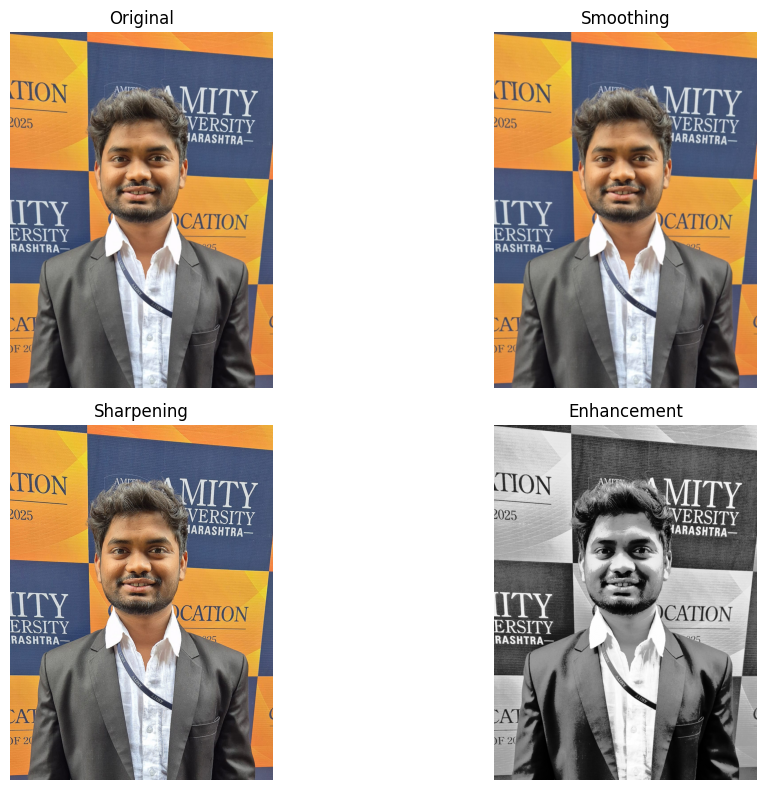

Smoothed image saved to /content/smoothed.jpg
Sharpened image saved to /content/sharpened.jpg
Enhanced image saved to /content/enhanced.jpg


In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_path = r"/content/profile.pic.jpeg"

img = cv2.imread(image_path)

if img is None:
    raise FileNotFoundError("Image not found")

smoothed = cv2.GaussianBlur(
    img,
    (5, 5),
    0
)

sharpen_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

sharpened = cv2.filter2D(
    img,
    -1,
    sharpen_kernel
)

gray = cv2.cvtColor(
    img,
    cv2.COLOR_BGR2GRAY
)

enhanced = cv2.equalizeHist(gray)

images = [
    cv2.cvtColor(img, cv2.COLOR_BGR2RGB),
    cv2.cvtColor(smoothed, cv2.COLOR_BGR2RGB),
    cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB),
    enhanced
]

titles = [
    "Original",
    "Smoothing",
    "Sharpening",
    "Enhancement"
]

plt.figure(figsize=(12, 8))

for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.imshow(images[i], cmap="gray" if i == 3 else None)
    plt.title(titles[i])
    plt.axis("off")

plt.tight_layout()
plt.show()

cv2.imwrite(
    r"/content/smoothed.jpg",
    smoothed
)
cv2.imwrite(
    r"/content/sharpened.jpg",
    sharpened
)
cv2.imwrite(
    r"/content/enhanced.jpg",
    enhanced
)
print("Smoothed image saved to /content/smoothed.jpg")
print("Sharpened image saved to /content/sharpened.jpg")
print("Enhanced image saved to /content/enhanced.jpg")